In [1]:
import numpy as np
import matplotlib.pyplot as plt



from functions.parse_data import synth_dataloader
import functions.handy_functions as hf
import torch

from cot_train.utils import MLP5

from pysolar.solar import *

from scipy.stats import pearsonr

from multivariate_quantile_regression.network_model import QuantileNetwork

2024-04-23 07:57:53.063045: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-04-23 07:57:53.097220: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-23 07:57:53.097237: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-23 07:57:53.098084: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-04-23 07:57:53.103782: I tensorflow/core/platform/cpu_feature_guar

In [2]:
#Load in images with information
import xarray as xr
f='/cloud/openeo/tiny_forest_5'
loaded_data = xr.open_dataset(f, engine='netcdf4', decode_times=True)
nodata = loaded_data.attrs.get("nodata", None)
loaded_data = loaded_data.where(loaded_data != nodata, np.nan)
times=loaded_data['t']
variables=loaded_data.variables
loaded_data

<xarray.Dataset> Size: 20MB
Dimensions:      (t: 7, y: 170, x: 178, sun_zenith: 7)
Coordinates:
  * t            (t) datetime64[ns] 56B 2020-06-13T10:30:31.024000 ... 2020-0...
  * y            (y) float64 1kB 6.51e+06 6.51e+06 ... 6.508e+06 6.508e+06
  * x            (x) float64 1kB 4.782e+05 4.782e+05 ... 4.8e+05 4.8e+05
    spatial_ref  int32 4B 3006
  * sun_zenith   (sun_zenith) float64 56B 35.3 31.92 34.05 ... 34.83 31.44 33.54
Data variables: (12/16)
    b02          (t, y, x) float64 2MB 795.0 791.0 802.0 ... 1.223e+03 1.218e+03
    b03          (t, y, x) float64 2MB 606.0 612.0 636.0 ... 1.036e+03 1.058e+03
    b04          (t, y, x) float64 2MB 376.0 365.0 377.0 ... 791.0 798.0 849.0
    b05          (t, y, x) float64 2MB 619.0 588.0 588.0 ... 1.007e+03 1.028e+03
    b06          (t, y, x) float64 2MB 1.336e+03 1.304e+03 ... 1.843e+03
    b07          (t, y, x) float64 2MB 1.525e+03 1.548e+03 ... 2.169e+03
    ...           ...
    b11          (t, y, x) float64 2MB 728.0 700.0 700.0 ... 1.183e+03 1.184e+03
    b12          (t, y, x) float64 2MB 323.0 319.0 319.0 ... 646.0 646.0 653.0
    west         float64 8B 14.62
    east         float64 8B 14.65
    north        float64 8B 58.73
    south        float64 8B 58.71
Attributes:
    crs:                EPSG:3006
    nodata:             -9999
    collection:         s2_msi_l1c
    datetime_from_dim:  2024-03-27T12:10:53.308569

In [3]:
## Setup for calculating RGB images

maxR = 3.0 ## max reflectance
midR = 0.13
sat = 1.3
gamma = 2.3
ray = { 'r': 0.013, 'g': 0.024, 'b': 0.041}



gOff = 0.01
gOffPow = gOff**gamma
gOffRange = (1 + gOff)**gamma - gOffPow


adjGamma = lambda b : ((b + gOff)**gamma - gOffPow)/gOffRange


def adj(a,tx,ty,maxC):
    ar = a/maxC
    ar[ar>1]=1
    ar[ar<0]=0
    return ar*(ar*(tx/maxC + ty - 1)- ty)/(ar*(2*tx/maxC - 1) - tx / maxC)

def satEnh(r,g,b):
    avgS = (r + g + b) / 3.0 * (1 - sat)
    tmpr=avgS + r * sat
    tmpr[tmpr>1]=1
    tmpr[tmpr<0]=0
    tmpg=avgS + g * sat
    tmpg[tmpg>1]=1
    tmpg[tmpg<0]=0
    tmpb=avgS + b * sat
    tmpb[tmpb>1]=1
    tmpb[tmpb<0]=0
    return [tmpr, tmpg, tmpb]


sAdj = lambda a: adjGamma(adj(a, midR, 1, maxR))
sRGB = lambda c: (12.92 * c) if c<= 0.0031308 else (1.055 * c**0.41666666666 - 0.055)

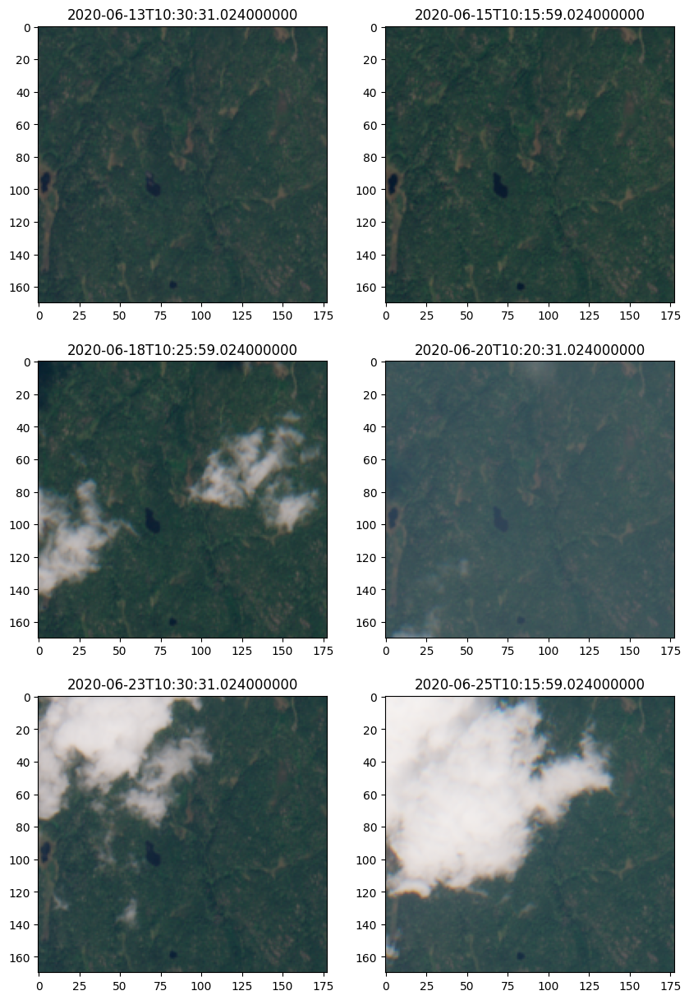

In [4]:
ncols=2
nrows=int(np.ceil((len(times)-1)/ncols))
divide=10000
ims=[]
ims_show=[]
sun_zenith_angles=loaded_data.sun_zenith.data

plt.rcParams['figure.figsize'] = [5*ncols, 5*nrows]
fig, axs = plt.subplots(ncols=ncols,nrows=nrows)
for i,ax in enumerate(axs.ravel()):

    ## Get bands ##
    b02=variables['b02'].data[i,:,:]/divide
    b03=variables['b03'].data[i,:,:]/divide
    b04=variables['b04'].data[i,:,:]/divide
    b05=variables['b05'].data[i,:,:]/divide
    b06=variables['b06'].data[i,:,:]/divide
    b07=variables['b07'].data[i,:,:]/divide
    b08=variables['b08'].data[i,:,:]/divide
    b8a=variables['b8a'].data[i,:,:]/divide
    b09=variables['b09'].data[i,:,:]/divide
    b10=variables['b10'].data[i,:,:]/divide
    b11=variables['b11'].data[i,:,:]/divide
    b12=variables['b12'].data[i,:,:]/divide

    ## Get "True" RGB ##
    b04T=sAdj(b04-ray['r'])
    b03T=sAdj(b03-ray['g'])
    b02T=sAdj(b02-ray['b'])

    rgbLin=satEnh(b04T,b03T,b02T)
    #avgS = ((b04T + b03T + b02T)/3.0) * (1 - sat)
    for k,p in enumerate(rgbLin[0]):
        for j,q in enumerate(p):
            rgbLin[0][k,j]=sRGB(q)
    for k,p in enumerate(rgbLin[1]):
        for j,q in enumerate(p):
            rgbLin[1][k,j]=sRGB(q)
    for k,p in enumerate(rgbLin[2]):
        for j,q in enumerate(p):
            rgbLin[2][k,j]=sRGB(q)

    im_show=np.zeros((np.shape(b03)[0],np.shape(b03)[1],3))
    im_show[:,:,0]=rgbLin[0]
    im_show[:,:,1]=rgbLin[1]
    im_show[:,:,2]=rgbLin[2]
    ims_show.append(im_show)

    ## Save image ##
    im=np.zeros((np.shape(b03)[0],np.shape(b03)[1],12))
    im[:,:,0]=b02
    im[:,:,1]=b03
    im[:,:,2]=b04
    im[:,:,3]=b05
    im[:,:,4]=b06
    im[:,:,5]=b07
    im[:,:,6]=b08
    im[:,:,7]=b8a
    im[:,:,8]=b09
    im[:,:,9]=b10
    im[:,:,10]=b11
    im[:,:,11]=b12
    ims.append(im)

    ax.imshow(im_show)
    ax.set_title(times.data[i])
    

In [5]:
#pair=[5,6] # For tiny_forest_2
#pair=[1,0] # tiny_forest_3
pair=[1,2] # tiny_forest_4
im_clear=ims[pair[0]]
im_cloud=ims[pair[1]]

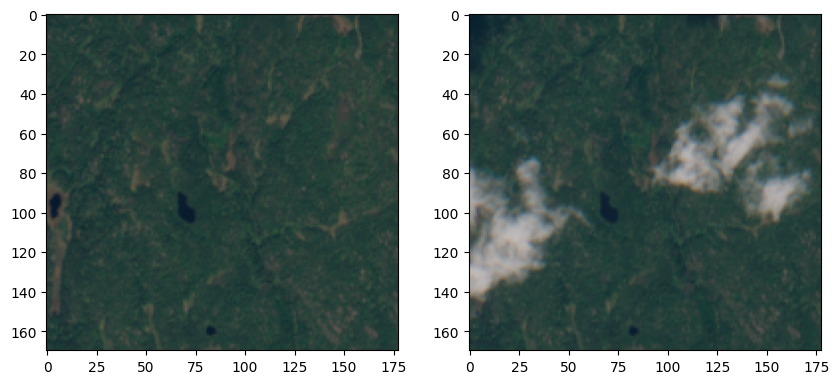

In [6]:
plt.rcParams['figure.figsize'] = [10, 5]
fig,axs=plt.subplots(ncols=2,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])

In [72]:
## Load models
main_filepath='pytorch_models/Angles_as_input-Sun_Zen'
n_ensemble=5
models=[]
for i in range(n_ensemble):
    models.append(torch.load(main_filepath+'/model'+str(i)+'/model_file'))

In [73]:
## Reshape cloudy data
im_shape=np.shape(im_cloud)
im_cloud_r=np.zeros((im_shape[0]*im_shape[1],im_shape[2]+1)) #+1 for sun zenith angle
for i in range(im_shape[2]):
    im_cloud_r[:,i]=np.reshape(im_cloud[:,:,i],im_shape[0]*im_shape[1])

im_cloud_r[:,-1]=sun_zenith_angles[pair[1]]


In [74]:

## Make prediction
for i,model in enumerate(models):
    if i==0:
        pred=model.predict(im_cloud_r)
    else:   
        pred=pred+model.predict(im_cloud_r)
pred=pred/len(models)

In [75]:
##Reshape back
index_median=1
im_pred=np.zeros(im_shape)
im_unc=np.zeros(im_shape)
for i in range(im_shape[2]):
    im_pred[:,:,i]=np.reshape(pred[:,i,index_median],im_shape[0:2])
    im_unc[:,:,i]=np.reshape(pred[:,i,-1]-pred[:,i,0],im_shape[0:2])

In [76]:
print(np.shape(im_pred))
print(np.shape(im_unc))

(170, 178, 12)
(170, 178, 12)


In [77]:
## Get "True" RGB ##
b04Tp=sAdj(im_pred[:,:,2]-ray['r'])
b03Tp=sAdj(im_pred[:,:,1]-ray['g'])
b02Tp=sAdj(im_pred[:,:,0]-ray['b'])

rgbLin=satEnh(b04Tp,b03Tp,b02Tp)
#avgS = ((b04T + b03T + b02T)/3.0) * (1 - sat)
for k,p in enumerate(rgbLin[0]):
    for j,q in enumerate(p):
        rgbLin[0][k,j]=sRGB(q)
for k,p in enumerate(rgbLin[1]):
    for j,q in enumerate(p):
        rgbLin[1][k,j]=sRGB(q)
for k,p in enumerate(rgbLin[2]):
    for j,q in enumerate(p):
        rgbLin[2][k,j]=sRGB(q)

im_pred_show=np.zeros((np.shape(b03)[0],np.shape(b03)[1],3))
im_pred_show[:,:,0]=rgbLin[0]
im_pred_show[:,:,1]=rgbLin[1]
im_pred_show[:,:,2]=rgbLin[2]

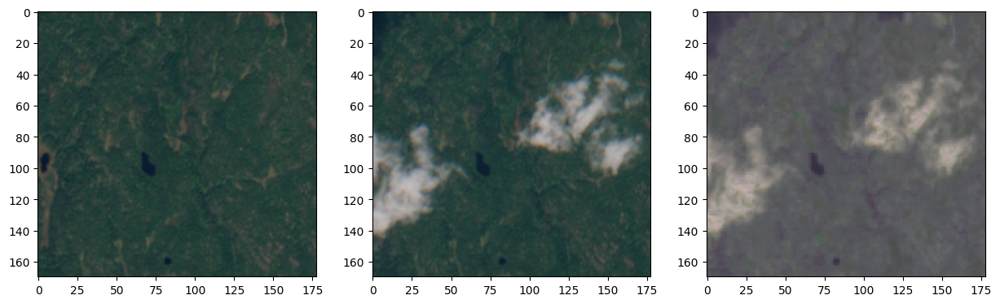

In [78]:
plt.rcParams['figure.figsize'] = [15, 5]
fig,axs=plt.subplots(ncols=3,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])
axs[2].imshow(im_pred_show)

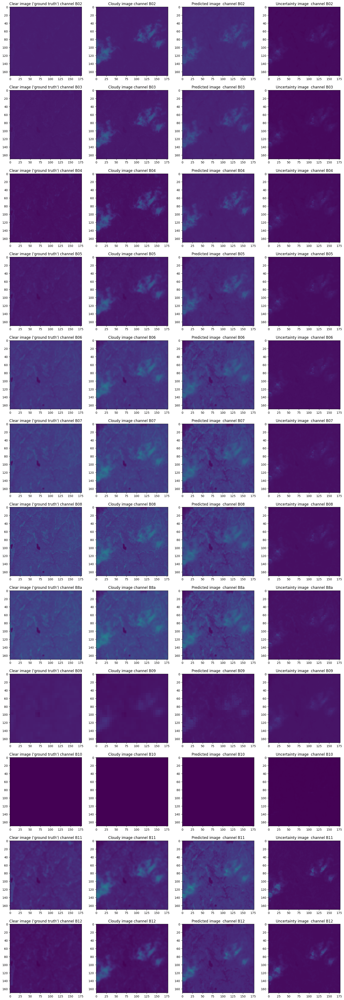

In [14]:
nchannels=12
plt.rcParams['figure.figsize'] = [20, 5*nchannels]
fig,axs=plt.subplots(ncols=4,nrows=nchannels)
for i in range(nchannels):
    axs[i,0].imshow(im_clear[:,:,i],vmin=0,vmax=1)
    axs[i,1].imshow(im_cloud[:,:,i],vmin=0,vmax=1)
    im_tmp=axs[i,2].imshow(im_pred[:,:,i],vmin=0,vmax=1)
    
    axs[i,3].imshow(im_unc[:,:,i],vmin=0,vmax=1)
    

    if i<7:
        axs[i,0].set_title("Clear image ('ground truth') channel B0"+str(i+2))
        axs[i,1].set_title("Cloudy image channel B0"+str(i+2))
        axs[i,2].set_title("Predicted image  channel B0"+str(i+2))
        axs[i,3].set_title("Uncertainty image  channel B0"+str(i+2))
    elif i==7:
        axs[i,0].set_title("Clear image ('ground truth') channel B8a")
        axs[i,1].set_title("Cloudy image channel B8a")
        axs[i,2].set_title("Predicted image  channel B8a")
        axs[i,3].set_title("Uncertainty image  channel B8a")
    elif i==8:
        axs[i,0].set_title("Clear image ('ground truth') channel B0"+str(i+1))
        axs[i,1].set_title("Cloudy image channel B0"+str(i+1))
        axs[i,2].set_title("Predicted image  channel B0"+str(i+1))
        axs[i,3].set_title("Uncertainty image  channel B0"+str(i+1))
    else:
        axs[i,0].set_title("Clear image ('ground truth') channel B"+str(i+1))
        axs[i,1].set_title("Cloudy image channel B"+str(i+1))
        axs[i,2].set_title("Predicted image  channel B"+str(i+1))
        axs[i,3].set_title("Uncertainty image  channel B"+str(i+1))

In [15]:
#np.linal.norm() -> Frobenius norm i.e root of the sum of squares
norm_og=np.linalg.norm(np.square((im_clear)-(im_cloud)),axis=(0,1))**2
norm_pred=np.linalg.norm(np.square((im_clear)-im_pred),axis=(0,1))**2
norm_gt=np.linalg.norm(np.square(im_clear),axis=(0,1))**2

NMSE_og=norm_og/norm_gt
NMSE_pred=norm_pred/norm_gt

for i in range(len(NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(NMSE_pred[i]))    

    print(' ')

NMSE before correction, Band 2: 1.0138240622272392
NMSE after correction, Band 2: 0.44664309132027846
 
NMSE before correction, Band 3: 1.9203154913745937
NMSE after correction, Band 3: 1.1263429541820575
 
NMSE before correction, Band 4: 15.179071437111068
NMSE after correction, Band 4: 13.612763951623627
 
NMSE before correction, Band 5: 1.8003494565258744
NMSE after correction, Band 5: 1.8464242245842741
 
NMSE before correction, Band 6: 0.06905843466868061
NMSE after correction, Band 6: 0.03854964765171512
 
NMSE before correction, Band 7: 0.041539275948653746
NMSE after correction, Band 7: 0.018994525812466405
 
NMSE before correction, Band 8: 0.03249465771967791
NMSE after correction, Band 8: 0.016272159312017715
 
NMSE before correction, Band 8A: 0.028626602621410195
NMSE after correction, Band 8A: 0.01372763096792873
 
NMSE before correction, Band 9: 0.020094394686398943
NMSE after correction, Band 9: 0.014006641933716146
 
NMSE before correction, Band 10: 0.009193989323459727


## COT model

In [16]:
from cot_train.utils import StatCollector, MLP5, mlp_inference
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [17]:
#model_load_paths=['smhi_models3/0/model_it_2000000','smhi_models3/1/model_it_2000000', 'smhi_models3/2/model_it_2000000','smhi_models3/3/model_it_2000000', 'smhi_models3/4/model_it_2000000',
#                 'smhi_models3/5/model_it_2000000','smhi_models3/6/model_it_2000000', 'smhi_models3/7/model_it_2000000','smhi_models3/8/model_it_2000000', 'smhi_models3/9/model_it_2000000']
model_load_paths=['smhi_models4/0/model_it_2000000','smhi_models4/1/model_it_2000000', 'smhi_models4/2/model_it_2000000','smhi_models4/3/model_it_2000000', 'smhi_models4/4/model_it_2000000']

input_dim = 13
output_dim = 1

models_cot=[]
for model_path in model_load_paths:
    model_cot = MLP5(input_dim, output_dim, apply_relu=True)
    model_cot.load_state_dict(torch.load(model_path, map_location=device))
    model_cot.to(device)
    models_cot.append(model_cot)

In [18]:
#means=[0.534958,0.538317,0.532992,0.629737,0.826885,0.859306,0.803385,0.880321,0.408178,0.066565,0.428241,0.301306,58.076266]
#stds=[0.218962,0.188747,0.236514,0.185751,0.169492,0.170012,0.162448,0.171793,0.237684,0.096908,0.309903,0.202586,15.602082]

means=[0.53892259,0.53099263,0.57942695,0.63021796,0.75956282,0.80769642,0.76741546,0.83960689,0.40266414,0.06668102,0.44278633,0.34460005,58.06583835]
stds =[0.19926734,0.17573319,0.17915619,0.1654085,0.1573165,0.15798441,0.15100182,0.15840717,0.23289204,0.09668435,0.3132122,0.22072329,15.56994119282951]

In [19]:
inputs = (im_cloud_r - means) / stds

image_input_tens=torch.Tensor(inputs).to(device)
#image_pred_cot=model_cot(image_input_tens).cpu().data.numpy()*50

preds = 0
for model_cot in models_cot:
    curr_preds=model_cot(image_input_tens)/len(models_cot)
    preds=preds+curr_preds

image_pred_cot=50*preds.cpu().data.numpy() #unnormalise

## Reshape back
im_pred_cot=np.reshape(image_pred_cot,im_shape[0:2])

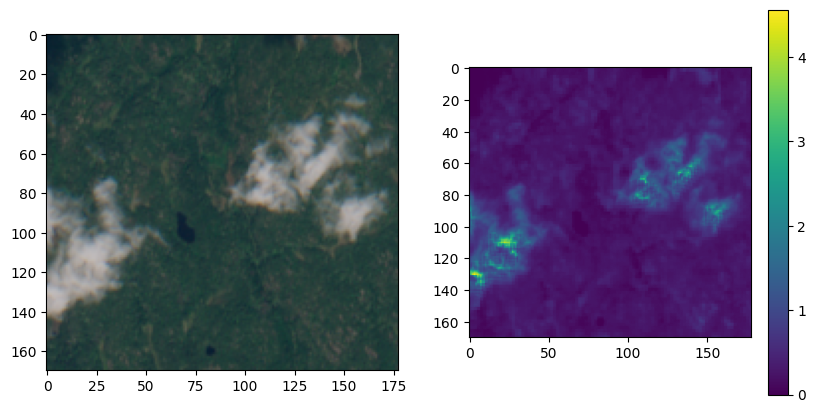

In [20]:
plt.rcParams['figure.figsize'] = [10, 5]
fig,axs =plt.subplots(ncols=2,nrows=1)
axs[0].imshow(ims_show[pair[1]])
im_cot=axs[1].imshow(im_pred_cot)
fig.colorbar(im_cot,ax=axs[1])

In [21]:
#Sort into categories instead
t_is_cloud = 0.025*50 #From Pirinen et. al.
t_thin_cloud = 0.015*50 #From Pirinen et. al.

#t_is_cloud = 0.025*50 #From Pirinen et. al.
#t_thin_cloud = 0.019*50 #From Pirinen et. al.

pred_clear = np.zeros(image_pred_cot.shape)
pred_thin = np.zeros(image_pred_cot.shape)
pred_thick = np.zeros(image_pred_cot.shape)

pred_clear[image_pred_cot<t_thin_cloud]=1
pred_thin[(image_pred_cot>=t_thin_cloud)&(image_pred_cot<t_is_cloud)]=1
pred_thick[image_pred_cot>=t_is_cloud]=1

#Append to cloudy data
im_cloud_r=np.concatenate((im_cloud_r,pred_clear,pred_thin,pred_thick),axis=1)

## Reshape back
im_pred_clear=np.reshape(pred_clear,im_shape[0:2])
im_pred_thin=np.reshape(pred_thin,im_shape[0:2])
im_pred_thick=np.reshape(pred_thick,im_shape[0:2])



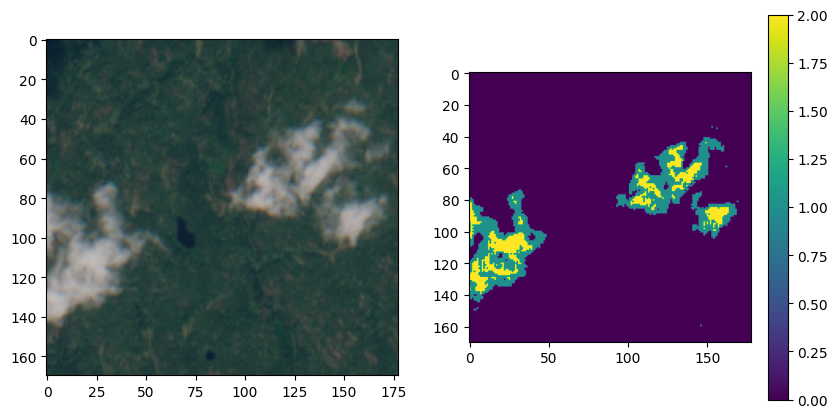

In [22]:
im_pred_cat = im_pred_thin+2*im_pred_thick

plt.rcParams['figure.figsize'] = [10, 5]
fig,axs =plt.subplots(ncols=2,nrows=1)
axs[0].imshow(ims_show[pair[1]])
im_cot=axs[1].imshow(im_pred_cat)
fig.colorbar(im_cot,ax=axs[1])

In [23]:
## Load models
main_filepath='pytorch_models/Final_model'
n_ensemble=10
models=[]
for i in range(n_ensemble):
    models.append(torch.load(main_filepath+'/model'+str(i)+'/model_file'))

## Make prediction
for i,model in enumerate(models):
    if i==0:
        pred=model.predict(im_cloud_r)
    else:   
        pred=pred+model.predict(im_cloud_r)
pred=pred/len(models)

##Reshape back
index_median=1
im_pred=np.zeros(im_shape)
im_unc=np.zeros(im_shape)
for i in range(im_shape[2]):
    im_pred[:,:,i]=np.reshape(pred[:,i,index_median],im_shape[0:2])
    im_unc[:,:,i]=np.reshape(pred[:,i,-1]-pred[:,i,0],im_shape[0:2])

In [24]:
im_cloud_r.shape

(30260, 16)

In [25]:
## Get "True" RGB ##
b04Tp=sAdj(im_pred[:,:,2]-ray['r'])
b03Tp=sAdj(im_pred[:,:,1]-ray['g'])
b02Tp=sAdj(im_pred[:,:,0]-ray['b'])

rgbLin=satEnh(b04Tp,b03Tp,b02Tp)
#avgS = ((b04T + b03T + b02T)/3.0) * (1 - sat)
for k,p in enumerate(rgbLin[0]):
    for j,q in enumerate(p):
        rgbLin[0][k,j]=sRGB(q)
for k,p in enumerate(rgbLin[1]):
    for j,q in enumerate(p):
        rgbLin[1][k,j]=sRGB(q)
for k,p in enumerate(rgbLin[2]):
    for j,q in enumerate(p):
        rgbLin[2][k,j]=sRGB(q)

im_pred_show=np.zeros((np.shape(b03)[0],np.shape(b03)[1],3))
im_pred_show[:,:,0]=rgbLin[0]
im_pred_show[:,:,1]=rgbLin[1]
im_pred_show[:,:,2]=rgbLin[2]

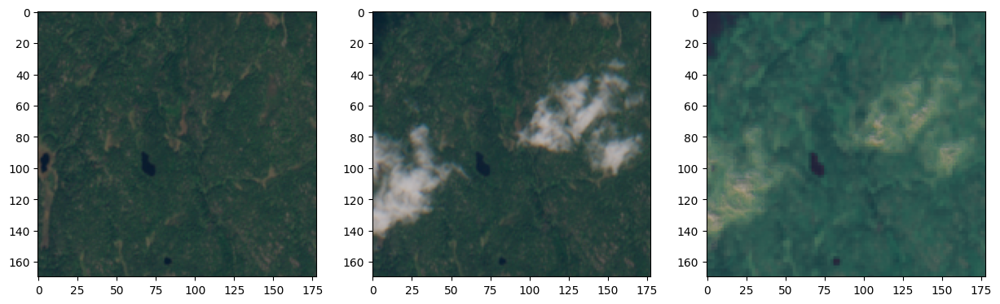

In [26]:
plt.rcParams['figure.figsize'] = [15, 5]
fig,axs=plt.subplots(ncols=3,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])
axs[2].imshow(im_pred_show)

In [27]:
#np.linal.norm() -> Frobenius norm i.e root of the sum of squares
norm_og=np.linalg.norm(np.square((im_clear)-(im_cloud)),axis=(0,1))**2
norm_pred=np.linalg.norm(np.square((im_clear)-im_pred),axis=(0,1))**2
norm_gt=np.linalg.norm(np.square(im_clear),axis=(0,1))**2

NMSE_og=norm_og/norm_gt
NMSE_pred=norm_pred/norm_gt

for i in range(len(NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(NMSE_pred[i]))    

    print(' ')


print('Mean NMSE before correction: '+str(np.mean(NMSE_og)))
print('Mean NMSE after correction: '+str(np.mean(NMSE_pred)))

NMSE before correction, Band 2: 1.0138240622272392
NMSE after correction, Band 2: 0.023860926026917063
 
NMSE before correction, Band 3: 1.9203154913745937
NMSE after correction, Band 3: 0.1500693157397649
 
NMSE before correction, Band 4: 15.179071437111068
NMSE after correction, Band 4: 0.5382385871975617
 
NMSE before correction, Band 5: 1.8003494565258744
NMSE after correction, Band 5: 0.25177753660423313
 
NMSE before correction, Band 6: 0.06905843466868061
NMSE after correction, Band 6: 0.041215587868448755
 
NMSE before correction, Band 7: 0.041539275948653746
NMSE after correction, Band 7: 0.02699567609407524
 
NMSE before correction, Band 8: 0.03249465771967791
NMSE after correction, Band 8: 0.01739600173793041
 
NMSE before correction, Band 8A: 0.028626602621410195
NMSE after correction, Band 8A: 0.01807915250200146
 
NMSE before correction, Band 9: 0.020094394686398943
NMSE after correction, Band 9: 0.06934033914889924
 
NMSE before correction, Band 10: 0.009193989323459727


In [28]:
## Load models
main_filepath='pytorch_models/Final_model_no_clear_noise'
n_ensemble=10
models=[]
for i in range(n_ensemble):
    models.append(torch.load(main_filepath+'/model'+str(i)+'/model_file'))

## Make prediction
for i,model in enumerate(models):
    if i==0:
        pred=model.predict(im_cloud_r)
    else:   
        pred=pred+model.predict(im_cloud_r)
pred=pred/len(models)

##Reshape back
index_median=1
im_pred=np.zeros(im_shape)
im_unc=np.zeros(im_shape)
for i in range(im_shape[2]):
    im_pred[:,:,i]=np.reshape(pred[:,i,index_median],im_shape[0:2])
    im_unc[:,:,i]=np.reshape(pred[:,i,-1]-pred[:,i,0],im_shape[0:2])

In [29]:
## Get "True" RGB ##
def TrueRGB(im_in):
    ray = { 'r': 0.013, 'g': 0.024, 'b': 0.041}
    b04Tp=sAdj(im_in[:,:,2]-ray['r'])
    b03Tp=sAdj(im_in[:,:,1]-ray['g'])
    b02Tp=sAdj(im_in[:,:,0]-ray['b'])

    rgbLin=satEnh(b04Tp,b03Tp,b02Tp)
    #avgS = ((b04T + b03T + b02T)/3.0) * (1 - sat)
    for k,p in enumerate(rgbLin[0]):
        for j,q in enumerate(p):
            rgbLin[0][k,j]=sRGB(q)
    for k,p in enumerate(rgbLin[1]):
        for j,q in enumerate(p):
            rgbLin[1][k,j]=sRGB(q)
    for k,p in enumerate(rgbLin[2]):
        for j,q in enumerate(p):
            rgbLin[2][k,j]=sRGB(q)

    im_show=np.zeros((np.shape(b03)[0],np.shape(b03)[1],3))
    im_show[:,:,0]=rgbLin[0]
    im_show[:,:,1]=rgbLin[1]
    im_show[:,:,2]=rgbLin[2]

    return im_show

In [30]:
im_pred_show=TrueRGB(im_pred)

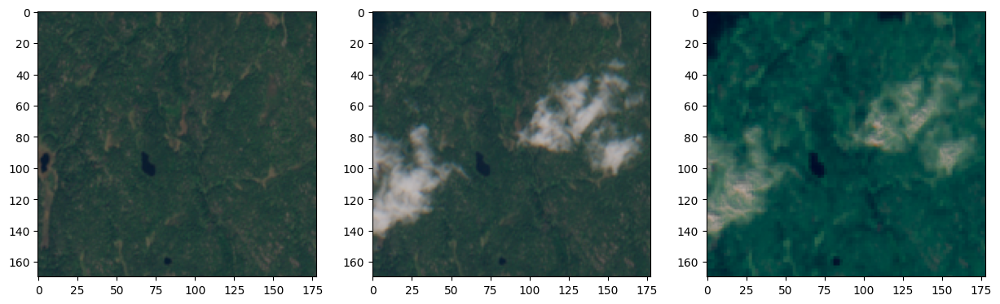

In [31]:
plt.rcParams['figure.figsize'] = [15, 5]
fig,axs=plt.subplots(ncols=3,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])
axs[2].imshow(im_pred_show)

In [32]:
#np.linal.norm() -> Frobenius norm i.e root of the sum of squares
norm_og=np.linalg.norm(np.square((im_clear)-(im_cloud)),axis=(0,1))**2
norm_pred=np.linalg.norm(np.square((im_clear)-im_pred),axis=(0,1))**2
norm_gt=np.linalg.norm(np.square(im_clear),axis=(0,1))**2

NMSE_og=norm_og/norm_gt
NMSE_pred=norm_pred/norm_gt

for i in range(len(NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(NMSE_pred[i]))    

    print(' ')

print('Mean NMSE before correction: '+str(np.mean(NMSE_og)))
print('Mean NMSE after correction: '+str(np.mean(NMSE_pred)))

NMSE before correction, Band 2: 1.0138240622272392
NMSE after correction, Band 2: 0.0356953807745874
 
NMSE before correction, Band 3: 1.9203154913745937
NMSE after correction, Band 3: 0.147026190859208
 
NMSE before correction, Band 4: 15.179071437111068
NMSE after correction, Band 4: 0.9328093953574911
 
NMSE before correction, Band 5: 1.8003494565258744
NMSE after correction, Band 5: 0.23731865008913505
 
NMSE before correction, Band 6: 0.06905843466868061
NMSE after correction, Band 6: 0.029016632892341274
 
NMSE before correction, Band 7: 0.041539275948653746
NMSE after correction, Band 7: 0.01949315425767765
 
NMSE before correction, Band 8: 0.03249465771967791
NMSE after correction, Band 8: 0.01332543507022313
 
NMSE before correction, Band 8A: 0.028626602621410195
NMSE after correction, Band 8A: 0.01445957791355836
 
NMSE before correction, Band 9: 0.020094394686398943
NMSE after correction, Band 9: 0.09252654773702909
 
NMSE before correction, Band 10: 0.009193989323459727
NMS

In [33]:
uncmeans = np.mean(im_unc,axis=2)

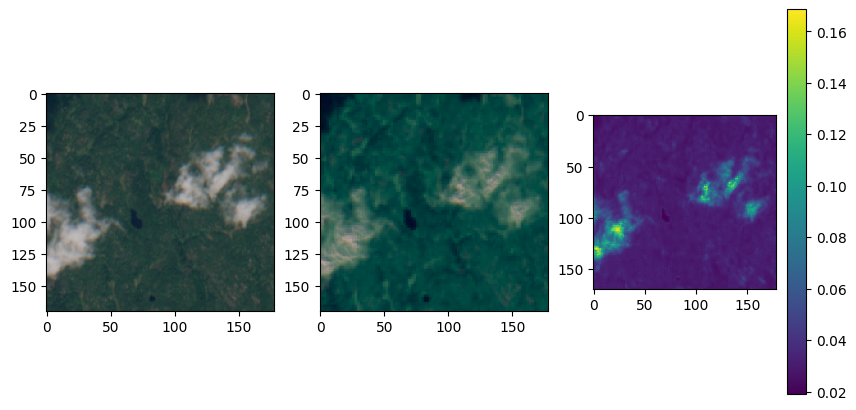

In [34]:
plt.rcParams['figure.figsize'] = [10, 5]
fig,axs =plt.subplots(ncols=3,nrows=1)
axs[0].imshow(ims_show[pair[1]])
axs[1].imshow(im_pred_show)
unc_img=axs[2].imshow(uncmeans)
fig.colorbar(unc_img,ax=axs[2])

In [35]:
## Load models
main_filepath='pytorch_models/Final_model_no_clear_noise_newsurf'
n_ensemble=5
models=[]
for i in range(n_ensemble):
    models.append(torch.load(main_filepath+'/model'+str(i)+'/model_file'))

## Make prediction
for i,model in enumerate(models):
    if i==0:
        pred=model.predict(im_cloud_r)
    else:   
        pred=pred+model.predict(im_cloud_r)
pred=pred/len(models)

##Reshape back
index_median=1
im_pred=np.zeros(im_shape)
im_unc=np.zeros(im_shape)
im_lower=np.zeros(im_shape)
im_higher=np.zeros(im_shape)
for i in range(im_shape[2]):
    im_pred[:,:,i]=np.reshape(pred[:,i,index_median],im_shape[0:2])
    im_lower[:,:,i]=np.reshape(pred[:,i,0],im_shape[0:2])
    im_higher[:,:,i]=np.reshape(pred[:,i,-1],im_shape[0:2])
    im_unc[:,:,i]=np.reshape(pred[:,i,-1]-pred[:,i,0],im_shape[0:2])
    

In [36]:
quant_rate=QuantileNetwork.quant_rate(im_clear.reshape(pred.shape[0],im_clear.shape[2]),pred)

quant_rate

array([0.22663307, 0.63214089, 0.86452688])

In [37]:
im_pred_show=TrueRGB(im_pred)

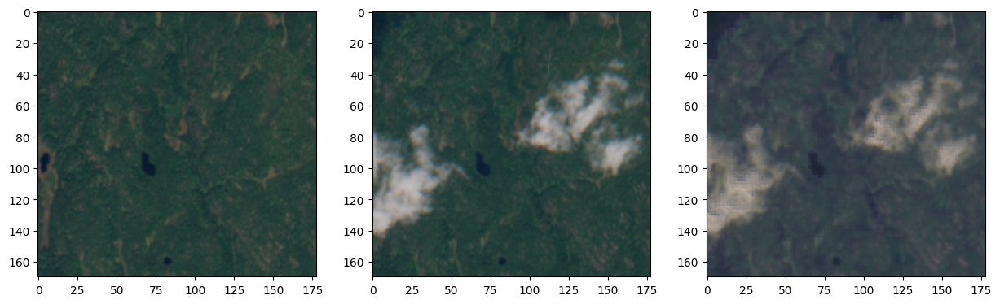

In [38]:
plt.rcParams['figure.figsize'] = [15, 5]
fig,axs=plt.subplots(ncols=3,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])
axs[2].imshow(im_pred_show)

In [39]:
#np.linal.norm() -> Frobenius norm i.e root of the sum of squares
norm_og=np.linalg.norm(np.square((im_clear)-(im_cloud)),axis=(0,1))**2
norm_pred=np.linalg.norm(np.square((im_clear)-im_pred),axis=(0,1))**2
norm_gt=np.linalg.norm(np.square(im_clear),axis=(0,1))**2

NMSE_og=norm_og/norm_gt
NMSE_pred=norm_pred/norm_gt

for i in range(len(NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(NMSE_pred[i]))    

    print(' ')

print('Mean NMSE before correction: '+str(np.mean(NMSE_og)))
print('Mean NMSE after correction: '+str(np.mean(NMSE_pred)))

NMSE before correction, Band 2: 1.0138240622272392
NMSE after correction, Band 2: 0.16065086533042727
 
NMSE before correction, Band 3: 1.9203154913745937
NMSE after correction, Band 3: 0.43050810908404746
 
NMSE before correction, Band 4: 15.179071437111068
NMSE after correction, Band 4: 5.129536903081359
 
NMSE before correction, Band 5: 1.8003494565258744
NMSE after correction, Band 5: 0.6563115072546543
 
NMSE before correction, Band 6: 0.06905843466868061
NMSE after correction, Band 6: 0.028375156924419977
 
NMSE before correction, Band 7: 0.041539275948653746
NMSE after correction, Band 7: 0.017308887857091865
 
NMSE before correction, Band 8: 0.03249465771967791
NMSE after correction, Band 8: 0.013450818620306018
 
NMSE before correction, Band 8A: 0.028626602621410195
NMSE after correction, Band 8A: 0.012810818591394811
 
NMSE before correction, Band 9: 0.020094394686398943
NMSE after correction, Band 9: 0.02673799258631284
 
NMSE before correction, Band 10: 0.009193989323459727

PearsonRResult(statistic=0.7979557767747678, pvalue=0.0)
0.5650352195680894


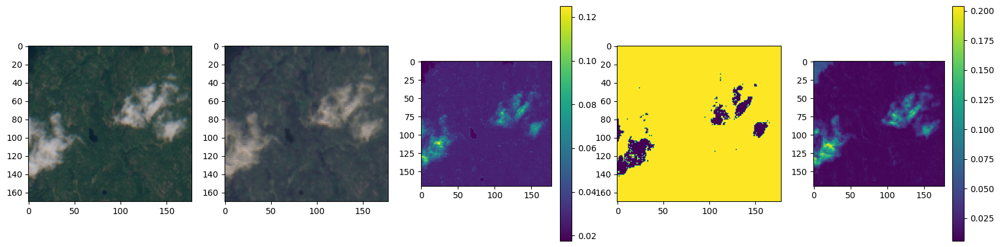

In [40]:
uncmeans = np.mean(im_unc,axis=2)
errs = np.abs(im_clear-im_pred)
errmeans = np.mean(errs,axis=2)

uncthresh=0.05
uncmask = (uncmeans < uncthresh).astype(int)

plt.rcParams['figure.figsize'] = [20, 5]
fig,axs =plt.subplots(ncols=5,nrows=1)
axs[0].imshow(ims_show[pair[1]])
axs[1].imshow(im_pred_show)
unc_img=axs[2].imshow(uncmeans)
fig.colorbar(unc_img,ax=axs[2])
axs[3].imshow(uncmask)
err_img=axs[4].imshow(errmeans)
fig.colorbar(err_img,ax=axs[4])


corr=pearsonr(uncmeans.flatten(),errmeans.flatten())
print(corr)

factor=np.mean(errmeans.flatten()/uncmeans.flatten())
print(factor)

In [41]:
print(uncmask[:5,:5])


[[1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]
 [1 1 1 1 1]]


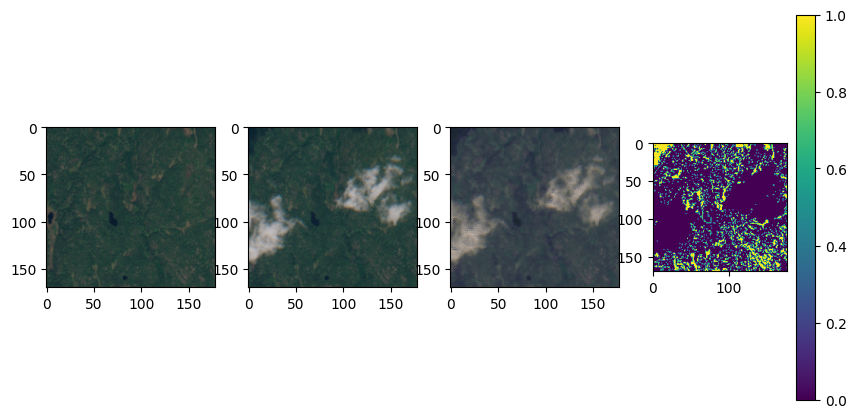

In [42]:
#Check wether pixels within +-20%
check_bands= [2]#[1,2,3,4,5,6,7,8,9,10,11]

within = np.ones([im_pred.shape[0],im_pred.shape[1]])
for x in range(im_pred.shape[0]):
    for y in range(im_pred.shape[1]):
        for b in check_bands:
            if errs[x,y,b]>0.2*im_clear[x,y,b]:
                within[x,y] = 0

plt.rcParams['figure.figsize'] = [10, 5]
fig,axs =plt.subplots(ncols=4,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])
axs[2].imshow(im_pred_show)
within_img=axs[3].imshow(within)
fig.colorbar(within_img,ax=axs[3])


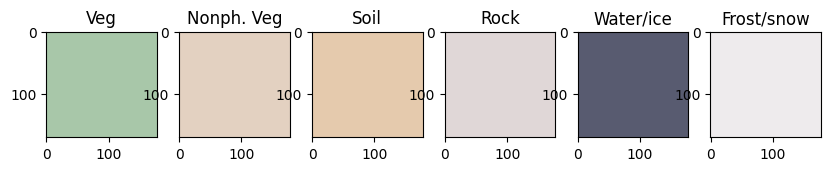

In [43]:
#Import and plot means of clear surface types after RGB correction

#import data
df = synth_dataloader(path_name='SMHIdata2',drop_cols = False)
#Dumb down surfaces
df=hf.dumb_down_surface(df)

#Find means
clearcols = ['Clear_B02','Clear_B03','Clear_B04','Clear_B05','Clear_B06','Clear_B07','Clear_B08','Clear_B08A','Clear_B09','Clear_B10','Clear_B11','Clear_B12']
veg_mean = np.mean(df[df['Surface_Desc_Dumb']=='vegetation'][clearcols].to_numpy(),axis=0)
nonph_mean = np.mean(df[df['Surface_Desc_Dumb']=='nonphotosyntheticvegetation'][clearcols].to_numpy(),axis=0)
soil_mean = np.mean(df[df['Surface_Desc_Dumb']=='soil'][clearcols].to_numpy(),axis=0)
rock_mean = np.mean(df[df['Surface_Desc_Dumb']=='rock'][clearcols].to_numpy(),axis=0)
watice_mean = np.mean(df[df['Surface_Desc_Dumb']=='water/ice'][clearcols].to_numpy(),axis=0)
frostsnow_mean = np.mean(df[df['Surface_Desc_Dumb']=='frost/snow'][clearcols].to_numpy(),axis=0)

im_veg = np.tile(veg_mean,[im_pred.shape[0],im_pred.shape[1],1])
im_nonph = np.tile(nonph_mean,[im_pred.shape[0],im_pred.shape[1],1])
im_soil = np.tile(soil_mean,[im_pred.shape[0],im_pred.shape[1],1])
im_rock = np.tile(rock_mean,[im_pred.shape[0],im_pred.shape[1],1])
im_watice = np.tile(watice_mean,[im_pred.shape[0],im_pred.shape[1],1])
im_frostsnow = np.tile(frostsnow_mean,[im_pred.shape[0],im_pred.shape[1],1])

im_veg_show=TrueRGB(im_veg)
im_nonph_show=TrueRGB(im_nonph)
im_soil_show=TrueRGB(im_soil)
im_rock_show=TrueRGB(im_rock)
im_watice_show=TrueRGB(im_watice)
im_frostsnow_show=TrueRGB(im_frostsnow)


plt.rcParams['figure.figsize'] = [10, 5]
fig,axs =plt.subplots(ncols=6,nrows=1)
axs[0].imshow(im_veg_show)
axs[1].imshow(im_nonph_show)
axs[2].imshow(im_soil_show)
axs[3].imshow(im_rock_show)
axs[4].imshow(im_watice_show)
axs[5].imshow(im_frostsnow_show)
axs[0].title.set_text('Veg')
axs[1].title.set_text('Nonph. Veg')
axs[2].title.set_text('Soil')
axs[3].title.set_text('Rock')
axs[4].title.set_text('Water/ice')
axs[5].title.set_text('Frost/snow')

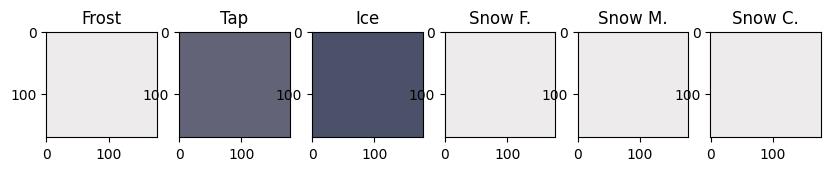

In [44]:
#import data
df_new = synth_dataloader(path_name='SMHIdata2_newsurf',drop_cols = False)
#All water surf
frost_mean = np.mean(df[df['Surface_Desc']=='water-frost-none'][clearcols].to_numpy(),axis=0)
tap_mean = np.mean(df[df['Surface_Desc']=='water-tapwater-none'][clearcols].to_numpy(),axis=0)
ice_mean = np.mean(df[df['Surface_Desc']=='water-ice-none'][clearcols].to_numpy(),axis=0)
snow_fine_mean = np.mean(df[df['Surface_Desc']=='water-snow-finegranular'][clearcols].to_numpy(),axis=0)
snow_med_mean = np.mean(df[df['Surface_Desc']=='water-snow-mediumgranular'][clearcols].to_numpy(),axis=0)
snow_coarse_mean = np.mean(df[df['Surface_Desc']=='water-snow-coarsegranular'][clearcols].to_numpy(),axis=0)

im_frost = np.tile(frost_mean,[im_pred.shape[0],im_pred.shape[1],1])
im_tap = np.tile(tap_mean,[im_pred.shape[0],im_pred.shape[1],1])
im_ice = np.tile(ice_mean,[im_pred.shape[0],im_pred.shape[1],1])
im_snowf = np.tile(snow_fine_mean,[im_pred.shape[0],im_pred.shape[1],1])
im_snowm = np.tile(snow_med_mean,[im_pred.shape[0],im_pred.shape[1],1])
im_snowc = np.tile(snow_coarse_mean,[im_pred.shape[0],im_pred.shape[1],1])

im_frost_show=TrueRGB(im_frost)
im_tap_show=TrueRGB(im_tap)
im_ice_show=TrueRGB(im_ice)
im_snowf_show=TrueRGB(im_snowf)
im_snowm_show=TrueRGB(im_snowm)
im_snowc_show=TrueRGB(im_snowc)

plt.rcParams['figure.figsize'] = [10, 5]
fig,axs =plt.subplots(ncols=6,nrows=1)
axs[0].imshow(im_frost_show)
axs[1].imshow(im_tap_show)
axs[2].imshow(im_ice_show)
axs[3].imshow(im_snowf_show)
axs[4].imshow(im_snowm_show)
axs[5].imshow(im_snowc_show)
axs[0].title.set_text('Frost')
axs[1].title.set_text('Tap')
axs[2].title.set_text('Ice')
axs[3].title.set_text('Snow F.')
axs[4].title.set_text('Snow M.')
axs[5].title.set_text('Snow C.')



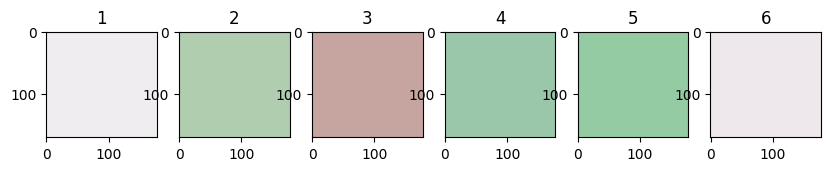

In [45]:
px1 = df[clearcols].iloc[0].to_numpy()
px2 = df[clearcols].iloc[1].to_numpy()
px3 = df[clearcols].iloc[2].to_numpy()
px4 = df[clearcols].iloc[3].to_numpy()
px5 = df[clearcols].iloc[4].to_numpy()
px6 = df[clearcols].iloc[5].to_numpy()

im_1 = np.tile(px1,[im_pred.shape[0],im_pred.shape[1],1])
im_2 = np.tile(px2,[im_pred.shape[0],im_pred.shape[1],1])
im_3 = np.tile(px3,[im_pred.shape[0],im_pred.shape[1],1])
im_4 = np.tile(px4,[im_pred.shape[0],im_pred.shape[1],1])
im_5 = np.tile(px5,[im_pred.shape[0],im_pred.shape[1],1])
im_6 = np.tile(px6,[im_pred.shape[0],im_pred.shape[1],1])

im_1_show=TrueRGB(im_1)
im_2_show=TrueRGB(im_2)
im_3_show=TrueRGB(im_3)
im_4_show=TrueRGB(im_4)
im_5_show=TrueRGB(im_5)
im_6_show=TrueRGB(im_6)

plt.rcParams['figure.figsize'] = [10, 5]
fig,axs =plt.subplots(ncols=6,nrows=1)
axs[0].imshow(im_1_show)
axs[1].imshow(im_2_show)
axs[2].imshow(im_3_show)
axs[3].imshow(im_4_show)
axs[4].imshow(im_5_show)
axs[5].imshow(im_6_show)
axs[0].title.set_text('1')
axs[1].title.set_text('2')
axs[2].title.set_text('3')
axs[3].title.set_text('4')
axs[4].title.set_text('5')
axs[5].title.set_text('6')

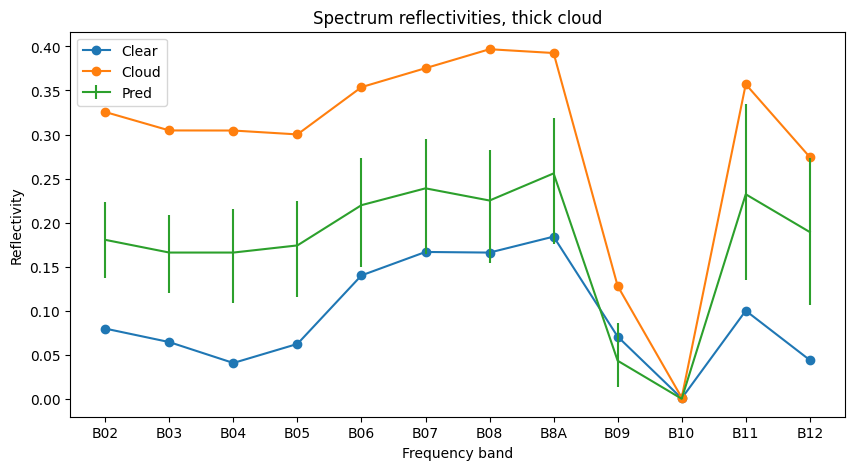

Cloud thickness prediction: 2.0


In [46]:
#Plot spectrum of cloudy vs pred vs clear pixel
#Select coords
xy=np.array([110,25])
#Find all band values for coord
clear_xy=im_clear[xy[0],xy[1],:]
cloud_xy=im_cloud[xy[0],xy[1],:]
pred_xy=im_pred[xy[0],xy[1],:]
unc_xy=np.concatenate(((pred_xy-im_lower[xy[0],xy[1],:]).reshape(1,12),(im_higher[xy[0],xy[1],:]-pred_xy).reshape(1,12)),axis=0)

x=np.arange(np.size(clear_xy))
plt.figure()
plt.plot(x,clear_xy,'-o')
plt.plot(x,cloud_xy,'-o')
plt.errorbar(x,pred_xy,yerr=unc_xy)

plt.xticks(x, ['B02','B03','B04','B05','B06','B07','B08','B8A','B09','B10','B11','B12'])
plt.title('Spectrum reflectivities, thick cloud')
plt.xlabel('Frequency band')
plt.ylabel('Reflectivity')
plt.legend(['Clear','Cloud','Pred'])
plt.show()

print('Cloud thickness prediction: '+str(im_pred_cat[xy[0],xy[1]]))

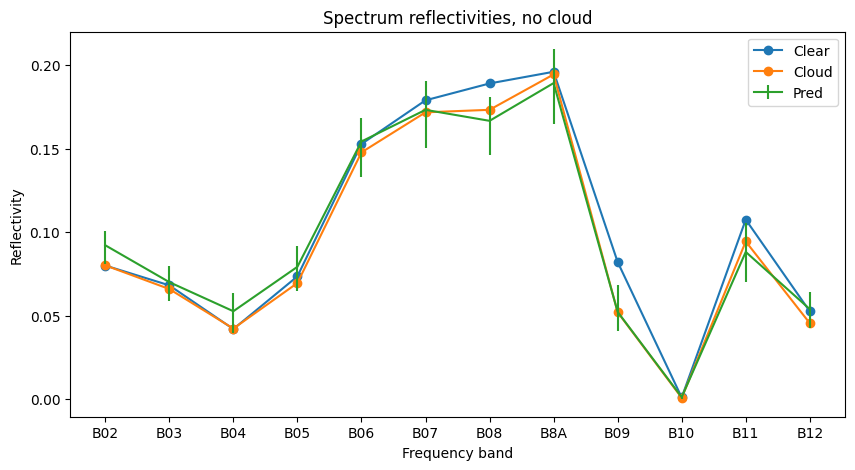

Cloud thickness prediction: 0.0


In [47]:
#Plot spectrum of cloudy vs pred vs clear pixel
#Select coords
xy=np.array([140,150])
#Find all band values for coord
clear_xy=im_clear[xy[0],xy[1],:]
cloud_xy=im_cloud[xy[0],xy[1],:]
pred_xy=im_pred[xy[0],xy[1],:]
unc_xy=np.concatenate(((pred_xy-im_lower[xy[0],xy[1],:]).reshape(1,12),(im_higher[xy[0],xy[1],:]-pred_xy).reshape(1,12)),axis=0)

x=np.arange(np.size(clear_xy))
plt.figure()
plt.plot(x,clear_xy,'-o')
plt.plot(x,cloud_xy,'-o')
plt.errorbar(x,pred_xy,unc_xy)

plt.xticks(x, ['B02','B03','B04','B05','B06','B07','B08','B8A','B09','B10','B11','B12'])
plt.title('Spectrum reflectivities, no cloud')
plt.xlabel('Frequency band')
plt.ylabel('Reflectivity')
plt.legend(['Clear','Cloud','Pred'])
plt.show()

print('Cloud thickness prediction: '+str(im_pred_cat[xy[0],xy[1]]))

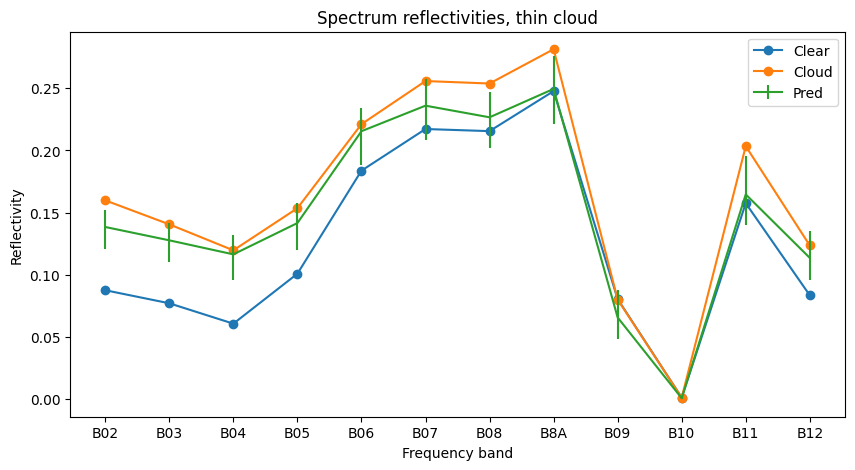

Cloud thickness prediction: 1.0


In [48]:
#Plot spectrum of cloudy vs pred vs clear pixel
#Select coords
xy=np.array([95,10])
#Find all band values for coord
clear_xy=im_clear[xy[0],xy[1],:]
cloud_xy=im_cloud[xy[0],xy[1],:]
pred_xy=im_pred[xy[0],xy[1],:]
unc_xy=np.concatenate(((pred_xy-im_lower[xy[0],xy[1],:]).reshape(1,12),(im_higher[xy[0],xy[1],:]-pred_xy).reshape(1,12)),axis=0)

x=np.arange(np.size(clear_xy))
plt.figure()
plt.plot(x,clear_xy,'-o')
plt.plot(x,cloud_xy,'-o')
plt.errorbar(x,pred_xy,unc_xy)

plt.xticks(x, ['B02','B03','B04','B05','B06','B07','B08','B8A','B09','B10','B11','B12'])
plt.title('Spectrum reflectivities, thin cloud')
plt.xlabel('Frequency band')
plt.ylabel('Reflectivity')
plt.legend(['Clear','Cloud','Pred'])
plt.show()

print('Cloud thickness prediction: '+str(im_pred_cat[xy[0],xy[1]]))

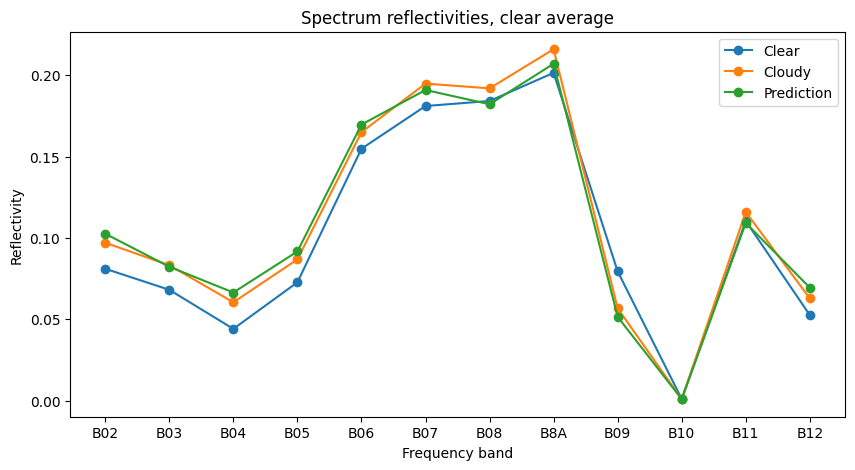

[0.08106585 0.06814364 0.04409905 0.07274306 0.15487844 0.18113827
 0.18423619 0.20154552 0.07944296 0.00097971 0.11044918 0.05259365]
[0.00350704 0.00539369 0.00726456 0.00923309 0.0172673  0.0209861
 0.02628233 0.02431537 0.00610984 0.00010017 0.0204025  0.01173433]
[0.1073 0.0985 0.0953 0.1311 0.2289 0.2777 0.3166 0.3207 0.1073 0.0013
 0.2272 0.1244]
[0.069  0.0422 0.0246 0.0186 0.0246 0.0247 0.0249 0.0253 0.0385 0.0007
 0.0101 0.0047]


In [49]:
#Plot average spectrum of clear image 
#Find all band values for coord
clear_vec = im_clear.reshape((im_clear.shape[0]*im_clear.shape[1],im_clear.shape[2]))
clear_mean=np.mean(clear_vec,axis=0)
clear_std=np.std(clear_vec,axis=0)

cloud_vec = im_cloud.reshape((im_cloud.shape[0]*im_cloud.shape[1],im_cloud.shape[2]))
cloud_mean=np.mean(cloud_vec,axis=0)
cloud_std=np.std(cloud_vec,axis=0)

pred_vec = im_pred.reshape((im_cloud.shape[0]*im_cloud.shape[1],im_cloud.shape[2]))
pred_mean=np.mean(pred_vec,axis=0)
pred_std=np.std(pred_vec,axis=0)

x=np.arange(np.size(clear_mean))
plt.figure()
plt.plot(x,clear_mean,'-o')
plt.plot(x,cloud_mean,'-o')
plt.plot(x,pred_mean,'-o')

plt.xticks(x, ['B02','B03','B04','B05','B06','B07','B08','B8A','B09','B10','B11','B12'])
plt.title('Spectrum reflectivities, clear average')
plt.xlabel('Frequency band')
plt.ylabel('Reflectivity')
plt.legend(['Clear','Cloudy','Prediction'])
plt.show()

print(clear_mean)
print(clear_std)

print(clear_vec.max(axis=0))
print(clear_vec.min(axis=0))


In [50]:
input_channs=im_cloud_r[:,:13].copy()
input_wCOT=np.concatenate((input_channs,image_pred_cot),axis=1)

## Load models
main_filepath='pytorch_models/COT_est_inp_wCOT'
n_ensemble=5
models=[]
for i in range(n_ensemble):
    models.append(torch.load(main_filepath+'/model'+str(i)+'/model_file'))

## Make prediction
for i,model in enumerate(models):
    if i==0:
        pred=model.predict(input_wCOT)
    else:   
        pred=pred+model.predict(input_wCOT)
pred=pred/len(models)

#Unnormalize pred
pred=pred
##Reshape back
index_median=1
im_pred=np.zeros(im_shape)
im_unc=np.zeros(im_shape)
im_lower=np.zeros(im_shape)
im_higher=np.zeros(im_shape)
for i in range(im_shape[2]):
    im_pred[:,:,i]=np.reshape(pred[:,i,index_median],im_shape[0:2])
    im_lower[:,:,i]=np.reshape(pred[:,i,0],im_shape[0:2])
    im_higher[:,:,i]=np.reshape(pred[:,i,-1],im_shape[0:2])
    im_unc[:,:,i]=np.reshape(pred[:,i,-1]-pred[:,i,0],im_shape[0:2])

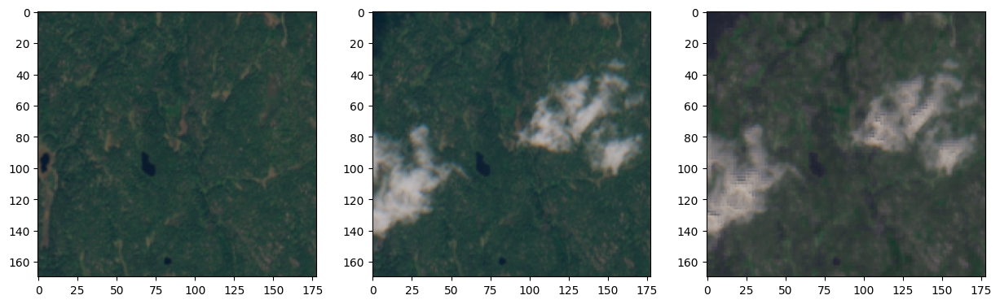

In [51]:
im_pred_show=TrueRGB(im_pred)

plt.rcParams['figure.figsize'] = [15, 5]
fig,axs=plt.subplots(ncols=3,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])
axs[2].imshow(im_pred_show)

In [52]:
#np.linal.norm() -> Frobenius norm i.e root of the sum of squares
norm_og=np.linalg.norm(np.square((im_clear)-(im_cloud)),axis=(0,1))**2
norm_pred=np.linalg.norm(np.square((im_clear)-im_pred),axis=(0,1))**2
norm_gt=np.linalg.norm(np.square(im_clear),axis=(0,1))**2

NMSE_og=norm_og/norm_gt
NMSE_pred=norm_pred/norm_gt

for i in range(len(NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(NMSE_pred[i]))    

    print(' ')

print('Mean NMSE before correction: '+str(np.mean(NMSE_og)))
print('Mean NMSE after correction: '+str(np.mean(NMSE_pred)))

NMSE before correction, Band 2: 1.0138240622272392
NMSE after correction, Band 2: 0.287838692574718
 
NMSE before correction, Band 3: 1.9203154913745937
NMSE after correction, Band 3: 0.6713466043358257
 
NMSE before correction, Band 4: 15.179071437111068
NMSE after correction, Band 4: 7.837934525490207
 
NMSE before correction, Band 5: 1.8003494565258744
NMSE after correction, Band 5: 0.9637853867305574
 
NMSE before correction, Band 6: 0.06905843466868061
NMSE after correction, Band 6: 0.036641008154540765
 
NMSE before correction, Band 7: 0.041539275948653746
NMSE after correction, Band 7: 0.021622263961008664
 
NMSE before correction, Band 8: 0.03249465771967791
NMSE after correction, Band 8: 0.016087371620890745
 
NMSE before correction, Band 8A: 0.028626602621410195
NMSE after correction, Band 8A: 0.01627230354738084
 
NMSE before correction, Band 9: 0.020094394686398943
NMSE after correction, Band 9: 0.014911344462977502
 
NMSE before correction, Band 10: 0.009193989323459727
NM

PearsonRResult(statistic=0.6782158474640656, pvalue=0.0)
0.5220983585296569


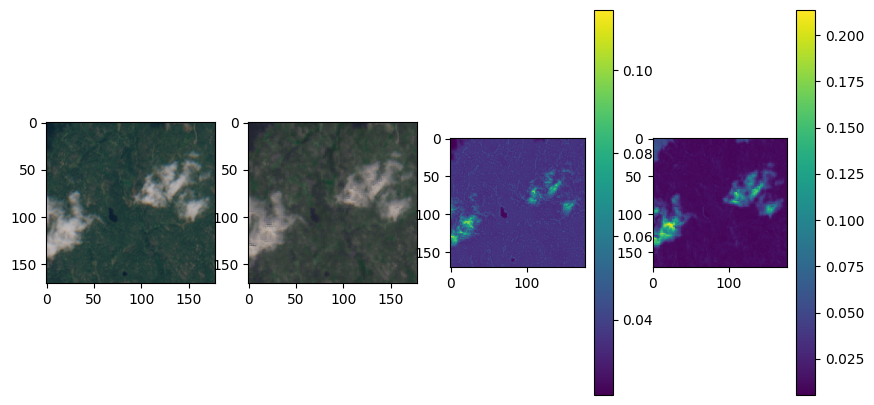

In [53]:
uncmeans = np.mean(im_unc,axis=2)
errs = np.abs(im_clear-im_pred)
errmeans = np.mean(errs,axis=2)

plt.rcParams['figure.figsize'] = [10, 5]
fig,axs =plt.subplots(ncols=4,nrows=1)
axs[0].imshow(ims_show[pair[1]])
axs[1].imshow(im_pred_show)
unc_img=axs[2].imshow(uncmeans)
fig.colorbar(unc_img,ax=axs[2])
err_img=axs[3].imshow(errmeans)
fig.colorbar(err_img,ax=axs[3])

corr=pearsonr(uncmeans.flatten(),errmeans.flatten())
print(corr)

factor=np.mean(errmeans.flatten()/uncmeans.flatten())
print(factor)

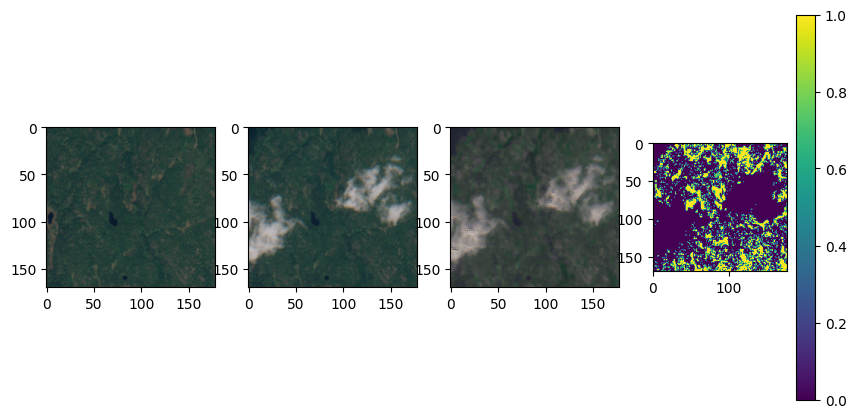

In [54]:
#Check wether pixels within +-20%
check_bands= [1,2,3,4,5,6]#[1,2,3,4,5,6,7,8,9,10,11]

within = np.ones([im_pred.shape[0],im_pred.shape[1]])
for x in range(im_pred.shape[0]):
    for y in range(im_pred.shape[1]):
        for b in check_bands:
            if errs[x,y,b]>0.2*im_clear[x,y,b]:
                within[x,y] = 0

plt.rcParams['figure.figsize'] = [10, 5]
fig,axs =plt.subplots(ncols=4,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])
axs[2].imshow(im_pred_show)
within_img=axs[3].imshow(within)
fig.colorbar(within_img,ax=axs[3])


In [55]:
input_channs=im_cloud_r[:,:13].copy()
input_noCOT=input_channs

## Load models
main_filepath='pytorch_models/COT_est_inp_noCOT'
n_ensemble=5
models=[]
for i in range(n_ensemble):
    models.append(torch.load(main_filepath+'/model'+str(i)+'/model_file'))

## Make prediction
for i,model in enumerate(models):
    if i==0:
        pred=model.predict(input_noCOT)
    else:   
        pred=pred+model.predict(input_noCOT)
pred=pred/len(models)

##Reshape back
index_median=1
im_pred=np.zeros(im_shape)
im_unc=np.zeros(im_shape)
im_lower=np.zeros(im_shape)
im_higher=np.zeros(im_shape)
for i in range(im_shape[2]):
    im_pred[:,:,i]=np.reshape(pred[:,i,index_median],im_shape[0:2])
    im_lower[:,:,i]=np.reshape(pred[:,i,0],im_shape[0:2])
    im_higher[:,:,i]=np.reshape(pred[:,i,-1],im_shape[0:2])
    im_unc[:,:,i]=np.reshape(pred[:,i,-1]-pred[:,i,0],im_shape[0:2])

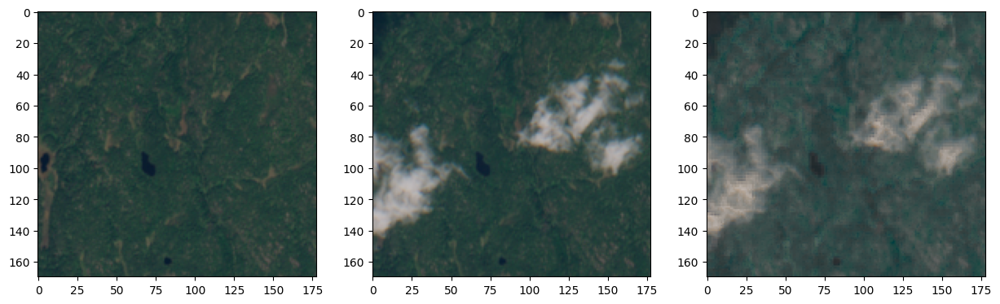

In [56]:
im_pred_show=TrueRGB(im_pred)

plt.rcParams['figure.figsize'] = [15, 5]
fig,axs=plt.subplots(ncols=3,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])
axs[2].imshow(im_pred_show)

In [57]:
#np.linal.norm() -> Frobenius norm i.e root of the sum of squares
norm_og=np.linalg.norm(np.square((im_clear)-(im_cloud)),axis=(0,1))**2
norm_pred=np.linalg.norm(np.square((im_clear)-im_pred),axis=(0,1))**2
norm_gt=np.linalg.norm(np.square(im_clear),axis=(0,1))**2

NMSE_og=norm_og/norm_gt
NMSE_pred=norm_pred/norm_gt

for i in range(len(NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(NMSE_pred[i]))    

    print(' ')

print('Mean NMSE before correction: '+str(np.mean(NMSE_og)))
print('Mean NMSE after correction: '+str(np.mean(NMSE_pred)))

NMSE before correction, Band 2: 1.0138240622272392
NMSE after correction, Band 2: 0.23488961925735716
 
NMSE before correction, Band 3: 1.9203154913745937
NMSE after correction, Band 3: 0.62354136371137
 
NMSE before correction, Band 4: 15.179071437111068
NMSE after correction, Band 4: 6.540650404815045
 
NMSE before correction, Band 5: 1.8003494565258744
NMSE after correction, Band 5: 0.7532836159745249
 
NMSE before correction, Band 6: 0.06905843466868061
NMSE after correction, Band 6: 0.031055826640692886
 
NMSE before correction, Band 7: 0.041539275948653746
NMSE after correction, Band 7: 0.01986670276286419
 
NMSE before correction, Band 8: 0.03249465771967791
NMSE after correction, Band 8: 0.014860682285054227
 
NMSE before correction, Band 8A: 0.028626602621410195
NMSE after correction, Band 8A: 0.016314031302532676
 
NMSE before correction, Band 9: 0.020094394686398943
NMSE after correction, Band 9: 0.017661404130078513
 
NMSE before correction, Band 10: 0.009193989323459727
NM

In [58]:
## Load models
main_filepath='pytorch_models/COT_est_inp_wCOT_dum'
n_ensemble=5
models=[]
for i in range(n_ensemble):
    models.append(torch.load(main_filepath+'/model'+str(i)+'/model_file'))

## Make prediction
for i,model in enumerate(models):
    if i==0:
        pred=model.predict(im_cloud_r[:,:16])
    else:   
        pred=pred+model.predict(im_cloud_r[:,:16])
pred=pred/len(models)

##Reshape back
index_median=1
im_pred=np.zeros(im_shape)
im_unc=np.zeros(im_shape)
im_lower=np.zeros(im_shape)
im_higher=np.zeros(im_shape)
for i in range(im_shape[2]):
    im_pred[:,:,i]=np.reshape(pred[:,i,index_median],im_shape[0:2])
    im_lower[:,:,i]=np.reshape(pred[:,i,0],im_shape[0:2])
    im_higher[:,:,i]=np.reshape(pred[:,i,-1],im_shape[0:2])
    im_unc[:,:,i]=np.reshape(pred[:,i,-1]-pred[:,i,0],im_shape[0:2])

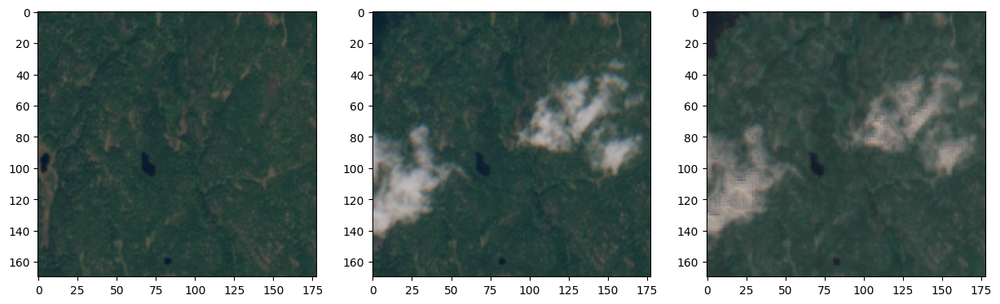

In [59]:
im_pred_show=TrueRGB(im_pred)

plt.rcParams['figure.figsize'] = [15, 5]
fig,axs=plt.subplots(ncols=3,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])
axs[2].imshow(im_pred_show)

In [60]:
#np.linal.norm() -> Frobenius norm i.e root of the sum of squares
norm_og=np.linalg.norm(np.square((im_clear)-(im_cloud)),axis=(0,1))**2
norm_pred=np.linalg.norm(np.square((im_clear)-im_pred),axis=(0,1))**2
norm_gt=np.linalg.norm(np.square(im_clear),axis=(0,1))**2

NMSE_og=norm_og/norm_gt
NMSE_pred=norm_pred/norm_gt

for i in range(len(NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(NMSE_pred[i]))    

    print(' ')

print('Mean NMSE before correction: '+str(np.mean(NMSE_og)))
print('Mean NMSE after correction: '+str(np.mean(NMSE_pred)))

NMSE before correction, Band 2: 1.0138240622272392
NMSE after correction, Band 2: 0.1611531859217426
 
NMSE before correction, Band 3: 1.9203154913745937
NMSE after correction, Band 3: 0.4265143778019252
 
NMSE before correction, Band 4: 15.179071437111068
NMSE after correction, Band 4: 4.930452065211953
 
NMSE before correction, Band 5: 1.8003494565258744
NMSE after correction, Band 5: 0.615826637188884
 
NMSE before correction, Band 6: 0.06905843466868061
NMSE after correction, Band 6: 0.0298511160419541
 
NMSE before correction, Band 7: 0.041539275948653746
NMSE after correction, Band 7: 0.019273196930158207
 
NMSE before correction, Band 8: 0.03249465771967791
NMSE after correction, Band 8: 0.015007535271761371
 
NMSE before correction, Band 8A: 0.028626602621410195
NMSE after correction, Band 8A: 0.014361688905858264
 
NMSE before correction, Band 9: 0.020094394686398943
NMSE after correction, Band 9: 0.027984500390814925
 
NMSE before correction, Band 10: 0.009193989323459727
NMS

In [61]:
xlow_clear=20
xhigh_clear=60
ylow_clear=25
yhigh_clear=75

xlow_cloud=80
xhigh_cloud=130
ylow_cloud=0
yhigh_cloud=30

norm_og=np.linalg.norm(np.square((im_clear[xlow_clear:xhigh_clear,ylow_clear:yhigh_clear,:])-(im_cloud[xlow_clear:xhigh_clear,ylow_clear:yhigh_clear,:])),axis=(0,1))**2
norm_pred=np.linalg.norm(np.square((im_clear[xlow_clear:xhigh_clear,ylow_clear:yhigh_clear,:])-im_pred[xlow_clear:xhigh_clear,ylow_clear:yhigh_clear,:]),axis=(0,1))**2
norm_gt=np.linalg.norm(np.square(im_clear[xlow_clear:xhigh_clear,ylow_clear:yhigh_clear,:]),axis=(0,1))**2

NMSE_og=norm_og/norm_gt
NMSE_pred=norm_pred/norm_gt

for i in range(len(NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(NMSE_pred[i]))    

    print(' ')

print('Mean NMSE before correction: '+str(np.mean(NMSE_og)))
print('Mean NMSE after correction: '+str(np.mean(NMSE_pred)))

NMSE before correction, Band 2: 3.1869641481922334e-06
NMSE after correction, Band 2: 7.069020357718124e-05
 
NMSE before correction, Band 3: 6.431041012577844e-06
NMSE after correction, Band 3: 0.00016479870190819012
 
NMSE before correction, Band 4: 2.5685565596306774e-05
NMSE after correction, Band 4: 0.0014374072128433872
 
NMSE before correction, Band 5: 6.681726815788129e-06
NMSE after correction, Band 5: 1.8285232359621997e-05
 
NMSE before correction, Band 6: 3.4727527926108724e-06
NMSE after correction, Band 6: 4.979122257229075e-05
 
NMSE before correction, Band 7: 8.189349351984598e-06
NMSE after correction, Band 7: 9.715159520331016e-05
 
NMSE before correction, Band 8: 1.713256938053043e-05
NMSE after correction, Band 8: 0.00010891026579231929
 
NMSE before correction, Band 8A: 5.453787149387281e-06
NMSE after correction, Band 8A: 3.8896574633950634e-05
 
NMSE before correction, Band 9: 0.017357614637314226
NMSE after correction, Band 9: 0.027707519597376183
 
NMSE before 

In [62]:
norm_og=np.linalg.norm(np.square((im_clear[xlow_cloud:xhigh_cloud,ylow_cloud:yhigh_cloud,:])-(im_cloud[xlow_cloud:xhigh_cloud,ylow_cloud:yhigh_cloud,:])),axis=(0,1))**2
norm_pred=np.linalg.norm(np.square((im_clear[xlow_cloud:xhigh_cloud,ylow_cloud:yhigh_cloud,:])-im_pred[xlow_cloud:xhigh_cloud,ylow_cloud:yhigh_cloud,:]),axis=(0,1))**2
norm_gt=np.linalg.norm(np.square(im_clear[xlow_cloud:xhigh_cloud,ylow_cloud:yhigh_cloud,:]),axis=(0,1))**2

NMSE_og=norm_og/norm_gt
NMSE_pred=norm_pred/norm_gt

for i in range(len(NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(NMSE_pred[i]))    

    print(' ')

print('Mean NMSE before correction: '+str(np.mean(NMSE_og)))
print('Mean NMSE after correction: '+str(np.mean(NMSE_pred)))

NMSE before correction, Band 2: 9.189119421518004
NMSE after correction, Band 2: 1.3692560448793485
 
NMSE before correction, Band 3: 18.065379132494325
NMSE after correction, Band 3: 3.9125134771958123
 
NMSE before correction, Band 4: 92.48117906734339
NMSE after correction, Band 4: 28.751622061536022
 
NMSE before correction, Band 5: 13.633818278698872
NMSE after correction, Band 5: 4.627514653303501
 
NMSE before correction, Band 6: 0.8361670001875972
NMSE after correction, Band 6: 0.3436769086722548
 
NMSE before correction, Band 7: 0.5002393481804245
NMSE after correction, Band 7: 0.21288633765537138
 
NMSE before correction, Band 8: 0.3913194385687946
NMSE after correction, Band 8: 0.14994449328912193
 
NMSE before correction, Band 8A: 0.3247867710282788
NMSE after correction, Band 8A: 0.139904653570691
 
NMSE before correction, Band 9: 0.06503443411099866
NMSE after correction, Band 9: 0.02454393872097267
 
NMSE before correction, Band 10: 0.04892784637984841
NMSE after correct

NMSE before correction, Band 2: 1.0138240622272392
NMSE after correction, Band 2: 0.09067047520239972
 
NMSE before correction, Band 3: 1.9203154913745937
NMSE after correction, Band 3: 0.2856991786885381
 
NMSE before correction, Band 4: 15.179071437111068
NMSE after correction, Band 4: 4.74570396140986
 
NMSE before correction, Band 5: 1.8003494565258744
NMSE after correction, Band 5: 0.6018171695836291
 
NMSE before correction, Band 6: 0.06905843466868061
NMSE after correction, Band 6: 0.020743990020126925
 
NMSE before correction, Band 7: 0.041539275948653746
NMSE after correction, Band 7: 0.013935569876996698
 
NMSE before correction, Band 8: 0.03249465771967791
NMSE after correction, Band 8: 0.01250406492062045
 
NMSE before correction, Band 8A: 0.028626602621410195
NMSE after correction, Band 8A: 0.013039600166713952
 
NMSE before correction, Band 9: 0.020094394686398943
NMSE after correction, Band 9: 0.020458639881523598
 
NMSE before correction, Band 10: 0.009193989323459727
N

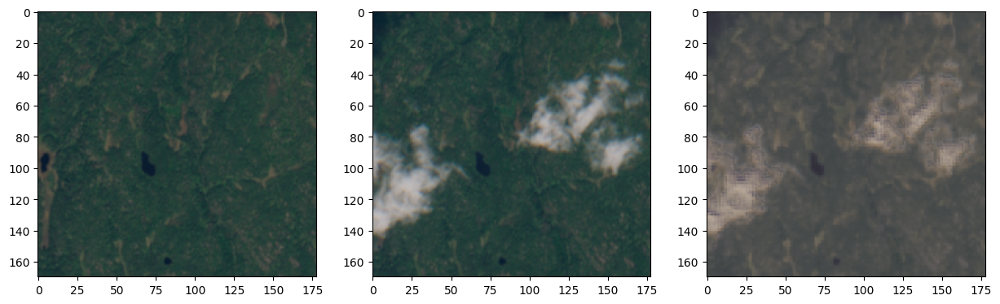

In [63]:
## Load models
main_filepath='pytorch_models/Final_model_newsurf_w_clear_noise'
n_ensemble=5
models=[]
for i in range(n_ensemble):
    models.append(torch.load(main_filepath+'/model'+str(i)+'/model_file'))

## Make prediction
for i,model in enumerate(models):
    if i==0:
        pred=model.predict(im_cloud_r)
    else:   
        pred=pred+model.predict(im_cloud_r)
pred=pred/len(models)

##Reshape back
index_median=1
im_pred=np.zeros(im_shape)
im_unc=np.zeros(im_shape)
im_lower=np.zeros(im_shape)
im_higher=np.zeros(im_shape)
for i in range(im_shape[2]):
    im_pred[:,:,i]=np.reshape(pred[:,i,index_median],im_shape[0:2])
    im_lower[:,:,i]=np.reshape(pred[:,i,0],im_shape[0:2])
    im_higher[:,:,i]=np.reshape(pred[:,i,-1],im_shape[0:2])
    im_unc[:,:,i]=np.reshape(pred[:,i,-1]-pred[:,i,0],im_shape[0:2])

im_pred_show=TrueRGB(im_pred)

plt.rcParams['figure.figsize'] = [15, 5]
fig,axs=plt.subplots(ncols=3,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])
axs[2].imshow(im_pred_show)

#np.linal.norm() -> Frobenius norm i.e root of the sum of squares
norm_og=np.linalg.norm(np.square((im_clear)-(im_cloud)),axis=(0,1))**2
norm_pred=np.linalg.norm(np.square((im_clear)-im_pred),axis=(0,1))**2
norm_gt=np.linalg.norm(np.square(im_clear),axis=(0,1))**2

NMSE_og=norm_og/norm_gt
NMSE_pred=norm_pred/norm_gt

for i in range(len(NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(NMSE_pred[i]))    

    print(' ')

print('Mean NMSE before correction: '+str(np.mean(NMSE_og)))
print('Mean NMSE after correction: '+str(np.mean(NMSE_pred)))

NMSE before correction, Band 2: 1.0138240622272392
NMSE after correction, Band 2: 0.2150210976711315
 
NMSE before correction, Band 3: 1.9203154913745937
NMSE after correction, Band 3: 0.5132048915229153
 
NMSE before correction, Band 4: 15.179071437111068
NMSE after correction, Band 4: 7.198275720375269
 
NMSE before correction, Band 5: 1.8003494565258744
NMSE after correction, Band 5: 0.7906436443918767
 
NMSE before correction, Band 6: 0.06905843466868061
NMSE after correction, Band 6: 0.033319523975447254
 
NMSE before correction, Band 7: 0.041539275948653746
NMSE after correction, Band 7: 0.020566956250365965
 
NMSE before correction, Band 8: 0.03249465771967791
NMSE after correction, Band 8: 0.01566853595296556
 
NMSE before correction, Band 8A: 0.028626602621410195
NMSE after correction, Band 8A: 0.014953956896925732
 
NMSE before correction, Band 9: 0.020094394686398943
NMSE after correction, Band 9: 0.00540151498091581
 
NMSE before correction, Band 10: 0.009193989323459727
NM

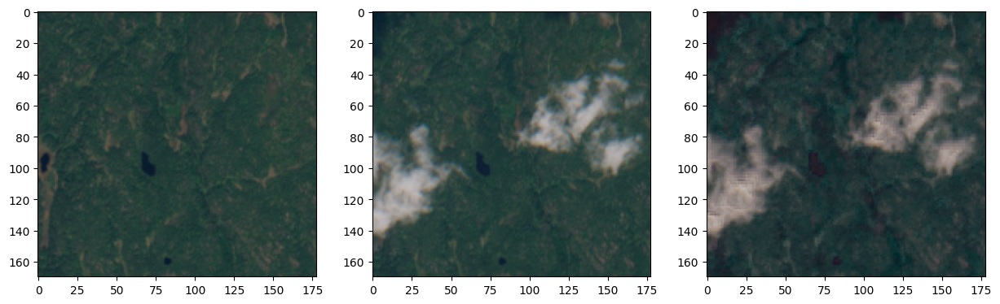

In [65]:
input=np.concatenate((im_cloud_r[:,:13],image_pred_cot),axis=1)

## Load models
main_filepath='pytorch_models/Clear_noise_False'
n_ensemble=5
models=[]
for i in range(n_ensemble):
    models.append(torch.load(main_filepath+'/model'+str(i)+'/model_file'))

## Make prediction
for i,model in enumerate(models):
    if i==0:
        pred=model.predict(input)
    else:   
        pred=pred+model.predict(input)
pred=pred/len(models)

##Reshape back
index_median=1
im_pred=np.zeros(im_shape)
im_unc=np.zeros(im_shape)
im_lower=np.zeros(im_shape)
im_higher=np.zeros(im_shape)
for i in range(im_shape[2]):
    im_pred[:,:,i]=np.reshape(pred[:,i,index_median],im_shape[0:2])
    im_lower[:,:,i]=np.reshape(pred[:,i,0],im_shape[0:2])
    im_higher[:,:,i]=np.reshape(pred[:,i,-1],im_shape[0:2])
    im_unc[:,:,i]=np.reshape(pred[:,i,-1]-pred[:,i,0],im_shape[0:2])

im_pred_show=TrueRGB(im_pred)

plt.rcParams['figure.figsize'] = [15, 5]
fig,axs=plt.subplots(ncols=3,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])
axs[2].imshow(im_pred_show)

#np.linal.norm() -> Frobenius norm i.e root of the sum of squares
norm_og=np.linalg.norm(np.square((im_clear)-(im_cloud)),axis=(0,1))**2
norm_pred=np.linalg.norm(np.square((im_clear)-im_pred),axis=(0,1))**2
norm_gt=np.linalg.norm(np.square(im_clear),axis=(0,1))**2

NMSE_og=norm_og/norm_gt
NMSE_pred=norm_pred/norm_gt

for i in range(len(NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(NMSE_pred[i]))    

    print(' ')

print('Mean NMSE before correction: '+str(np.mean(NMSE_og)))
print('Mean NMSE after correction: '+str(np.mean(NMSE_pred)))

bands=np.array([0,1,2,3,4,5,6,7,8,10,11])
print('Mean NMSE (except band 10) before correction: '+str(np.mean(NMSE_og[bands])))
print('Mean NMSE (except band 10) after correction: '+str(np.mean(NMSE_pred[bands])))

In [66]:
NMSE_pred.shape

(12,)

NMSE before correction, Band 2: 1.0138240622272392
NMSE after correction, Band 2: 0.18851547119526527
 
NMSE before correction, Band 3: 1.9203154913745937
NMSE after correction, Band 3: 0.5000792904227986
 
NMSE before correction, Band 4: 15.179071437111068
NMSE after correction, Band 4: 7.377230845139093
 
NMSE before correction, Band 5: 1.8003494565258744
NMSE after correction, Band 5: 0.9327656312719391
 
NMSE before correction, Band 6: 0.06905843466868061
NMSE after correction, Band 6: 0.03396272733030127
 
NMSE before correction, Band 7: 0.041539275948653746
NMSE after correction, Band 7: 0.020947975958518297
 
NMSE before correction, Band 8: 0.03249465771967791
NMSE after correction, Band 8: 0.015700359603134005
 
NMSE before correction, Band 8A: 0.028626602621410195
NMSE after correction, Band 8A: 0.015562486463019385
 
NMSE before correction, Band 9: 0.020094394686398943
NMSE after correction, Band 9: 0.005859004131741218
 
NMSE before correction, Band 10: 0.009193989323459727


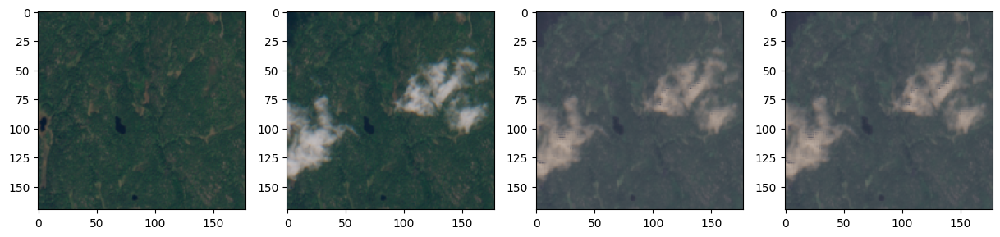

In [68]:
input=np.concatenate((im_cloud_r[:,:13],image_pred_cot),axis=1)

## Load models
main_filepath='pytorch_models/Clear_noise_True'
n_ensemble=5
models=[]
for i in range(n_ensemble):
    models.append(torch.load(main_filepath+'/model'+str(i)+'/model_file'))

## Make prediction
for i,model in enumerate(models):
    if i==0:
        pred=model.predict(input)
    else:   
        pred=pred+model.predict(input)
pred=pred/len(models)

##Reshape back
index_median=1
im_pred=np.zeros(im_shape)
im_unc=np.zeros(im_shape)
im_lower=np.zeros(im_shape)
im_higher=np.zeros(im_shape)
for i in range(im_shape[2]):
    im_pred[:,:,i]=np.reshape(pred[:,i,index_median],im_shape[0:2])
    im_lower[:,:,i]=np.reshape(pred[:,i,0],im_shape[0:2])
    im_higher[:,:,i]=np.reshape(pred[:,i,-1],im_shape[0:2])
    im_unc[:,:,i]=np.reshape(pred[:,i,-1]-pred[:,i,0],im_shape[0:2])

im_pred_show=TrueRGB(im_pred)
im_pred_show2=hf.Sentinel2TrueColor(im_pred)

plt.rcParams['figure.figsize'] = [15, 5]
fig,axs=plt.subplots(ncols=4,nrows=1)
axs[0].imshow(ims_show[pair[0]])
axs[1].imshow(ims_show[pair[1]])
axs[2].imshow(im_pred_show)
axs[3].imshow(im_pred_show2)

#np.linal.norm() -> Frobenius norm i.e root of the sum of squares
norm_og=np.linalg.norm(np.square((im_clear)-(im_cloud)),axis=(0,1))**2
norm_pred=np.linalg.norm(np.square((im_clear)-im_pred),axis=(0,1))**2
norm_gt=np.linalg.norm(np.square(im_clear),axis=(0,1))**2

NMSE_og=norm_og/norm_gt
NMSE_pred=norm_pred/norm_gt

for i in range(len(NMSE_og)):
    if i<=6:
        print('NMSE before correction, Band '+str(i+2)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+2)+': '+str(NMSE_pred[i]))
    elif i==7:
        print('NMSE before correction, Band '+str(i+1)+'A: '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+'A: '+str(NMSE_pred[i]))
    else:
        print('NMSE before correction, Band '+str(i+1)+': '+str(NMSE_og[i]))
        print('NMSE after correction, Band '+str(i+1)+': '+str(NMSE_pred[i]))    

    print(' ')

print('Mean NMSE before correction: '+str(np.mean(NMSE_og)))
print('Mean NMSE after correction: '+str(np.mean(NMSE_pred)))

bands=np.array([0,1,2,3,4,5,6,7,8,10,11])
print('Mean NMSE (except band 10) before correction: '+str(np.mean(NMSE_og[bands])))
print('Mean NMSE (except band 10) after correction: '+str(np.mean(NMSE_pred[bands])))

In [71]:
sum(sum(sum(np.abs(im_pred_show-im_pred_show2))))

0.0